In [118]:
from collections import Counter
import os
from glob import glob
import re

from graphviz import Source
from IPython.display import display, Markdown
import matplotlib.pyplot as plt
from matplotlib.ticker import EngFormatter
import networkx as nx
import numpy as np
from scipy import stats
import pandas as pd
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter



sns.set_style('white')
sns.set_context('notebook')

def plot_style(figsize=(12, 6), labelsize=20, titlesize=24, ticklabelsize=14, **kwargs):
   basic_style = {
       'figure.figsize': figsize,
       'axes.labelsize': labelsize,
       'axes.titlesize': titlesize,
       'xtick.labelsize': ticklabelsize,
       'ytick.labelsize': ticklabelsize,
       'axes.spines.top': False,
       'axes.spines.right': False,
       'axes.spines.left': False,
       'axes.grid': False,
       'axes.grid.axis': 'y',
   }
   basic_style.update(kwargs)
   return plt.rc_context(rc=basic_style)

blue = sns.xkcd_rgb['ocean blue']

## Create df with performance data

### Clone map

In [119]:
data = pd.read_csv('../../data/YFV2001_clone_key/YFV2001_clone_key', sep = '\t')
data.head()

clones_map_raw = data.copy()

In [120]:
#clones_map_raw

In [121]:
clones_map = dict(clones_map_raw[['tree_id', 'clone']].values)
all_clones = list(clones_map_raw.clone.unique())

In [122]:
n_samples_per_clone = clones_map_raw.clone.value_counts()
n_samples_per_clone

149     20
118     18
107     16
122      8
108      6
143      4
bulk     1
Name: clone, dtype: int64

### Load info from mt-SCITE runs

In [123]:
scite_input_path = f'../../../mt-SCITE/mt-SCITE_output/YFV2001_m_chains/stdout/'

scite_stdout_filenames = list(glob(os.path.join(scite_input_path, '*.txt')))

# Get log likelihood scores and n trees
exp_std = []
lhood = []
n_trees = []

for filename in sorted(scite_stdout_filenames, key=lambda var:[int(x) if x.isdigit() else x for x in re.findall(r'[^0-9]|[0-9]+', var)]):
    #print(filename)
    name = os.path.basename(filename).rsplit('.', 1)[0].rsplit('.', 1)[0]
    #print(name)
    exp_std.append(name)
    #print(files)
    file = open(filename, "r")
    for line in file:
        if 'best log score for tree:' in line:
            score = line.split('	')[1].rstrip()
            lhood.append(score)
            lhood = [float(x) for x in lhood]
            #print(lhood)
        if 'opt tree' in line:
            n = line.split(' opt')[0].lstrip()
            n_trees.append(n)
            n_trees = [int(x) for x in n_trees]
            #print(n_trees)
            

### Load info from pmats

In [124]:

pmat_input_path = f'../../data/YFV2001_matrix_output_m_chains/'

pmats = list(glob(os.path.join(pmat_input_path, '*.csv')))

pmat_names = []
n_pmat_rows = []

for filename in sorted(pmats, key=lambda var:[int(x) if x.isdigit() else x for x in re.findall(r'[^0-9]|[0-9]+', var)]):
    name = os.path.basename(filename).rsplit('.', 1)[0]
    file = open(filename, "r")
    n = len(file.readlines())
    n_pmat_rows.append(n)
    pmat_names.append(name)

# store in a dict
pmat_info = {pmat_names[i]: n_pmat_rows[i] for i in range(len(pmat_names))}


### Create df containing info from mt-SCITE and pmat

In [125]:
samples = 73

performance = pd.DataFrame(exp_std)
performance['lhood'] = lhood
performance['lhood'] = performance['lhood'].astype(float)

performance['n trees'] = n_trees
performance['error_rate'] = performance[0].str.split('_').str.get(0)

performance = performance.rename(columns={0: 'run'})
performance = performance.set_index('run')

runs = performance.index.tolist()
performance = performance.sort_index()

performance['n_muts'] = performance['error_rate'].map(pmat_info)

performance['entries'] = performance['n_muts']*samples

performance['lhood_entries'] = performance['lhood']/performance['entries']

In [126]:
performance

,lhood,n trees,error_rate,n_muts,entries,lhood_entries
run,,,,,,
0.0001_1,-14677.189086,23,0.0001,453,33069,-0.443835
0.0001_10,-14256.733151,52,0.0001,453,33069,-0.431121
0.0001_2,-14290.111349,62,0.0001,453,33069,-0.432130
0.0001_3,-14521.475010,17,0.0001,453,33069,-0.439127
0.0001_4,-14568.380316,113,0.0001,453,33069,-0.440545
...,...,...,...,...,...,...
0.1_5,-821.356239,11,0.1,38,2774,-0.296091
0.1_6,-814.653071,15,0.1,38,2774,-0.293675
0.1_7,-815.288763,1,0.1,38,2774,-0.293904


### Read trees

In [127]:
MAX_TREES_PER_ERROR_RATE = 10
all_trees = {}
for run, n in zip(runs, n_trees):
    all_trees[run] = []
    for idx in range(min(MAX_TREES_PER_ERROR_RATE, n)):
        #print(n)
        tree_filename = f'../../../mt-SCITE/mt-SCITE_output/YFV2001_m_chains/{run}_map{idx}.gv' 
        tree = nx.drawing.nx_pydot.read_dot(tree_filename)
        tree.remove_node('\\n')
        all_trees[run].append(tree)
        #print(error_rate)

In [128]:
def new_count_row(all_clone_names, clone_name=None):
    """ Create a DataFrame row with one entry per clone name. 
    
    If `clone_name` is not None, initialize that entry to 1.
    """
    row = pd.Series(data=0, index=all_clone_names)
    if clone_name is not None:
        row[clone_name] = 1
    return row

def dfs_clones_count(g, clones, all_clone_names, source_node):
    clones_count = pd.DataFrame({sample_name: new_count_row(all_clones, clone_name) for sample_name, clone_name in clones.items()})
    for pre_node, post_node, edge_label in nx.dfs_labeled_edges(g, source_node):
        if edge_label is not 'reverse' or pre_node == post_node: 
            continue
        pre_node_counter = clones_count.get(pre_node, new_count_row(all_clones))
        if post_node not in clones_count.columns:
            print('!! possible mutation in a leaf: not found', post_node)
            continue
        clones_count[pre_node] = pre_node_counter + clones_count[post_node]

    return clones_count

def purity(clones_count):
    return clones_count.div(clones_count.sum(axis=0), axis=1)

def get_root_node(t):
    root_nodes = [n for n,d in t.in_degree() if d==0]
    assert len(root_nodes) == 1
    root_node = root_nodes[0]
    return root_node

<>:14: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:14: SyntaxWarning: "is not" with a literal. Did you mean "!="?
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:14: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if edge_label is not 'reverse' or pre_node == post_node:


# Avg purity of nodes with >1 sample

In [129]:
performance['avg_purity_more_than_one_sample'] = 0
performance['frac_purity_100_more_than_one_sample'] = 0
for error_rate, trees in all_trees.items():
    avg_purities = []
    frac_purities_100 = []
    n_purities_100 = []
    for t in trees:
        #print(error_rate, get_root_node(t))
        #print(error_rate)
        #print(get_root_node(t))
        
        #print(root_node)
        clones_count = dfs_clones_count(t, clones_map, all_clones, source_node=get_root_node(t))
        
        # which nodes have more than one sample
        more_than_one_sample = clones_count.sum(axis=0) > 1
        #print(more_than_one_sample)
        
        # p is a matrix with rows = clones and columns = nodes.
        # included nodes are those attached to > 1 sample
        # the values in p are the clone purities in each node
        p = purity(clones_count).loc[:, more_than_one_sample]
        # print p before root node is removed
        #print(p)
        
        # Drop root node since it is attached to all samples
        # Get the root node
        root_node = str(get_root_node(t))
        # Get the index of the root node
        root_idx = list(p.columns).index(root_node)
        #print(root_idx)
        # drop the root node 
        p = p.drop(p.columns[[root_idx]],axis = 1)
        # Check that root node is removed
        #print(p)
        
        # Average purity
        avg_purity = p.max(axis=0).mean()
        avg_purities.append(avg_purity)
        #print(avg_purities)
        # Fraction of nodes with 100% purity
        is_purity_100 = np.isclose(p.max(axis=0), 1.0)
        frac_purity_100 = is_purity_100.sum() / is_purity_100.shape[0]
        frac_purities_100.append(frac_purity_100)
        
    performance.loc[error_rate, 'avg_purity_more_than_one_sample'] = avg_purities[0]
    performance.loc[error_rate, 'frac_purity_100_more_than_one_sample'] = frac_purities_100[0]

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 316
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 269
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 259
!! possible mutation in a leaf: not found 112
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 50
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 339
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not f

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 113


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 282


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 438
!! possible mutation in a leaf: not found 417
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 415


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 377
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 316
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 269
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 259
!! possible mutation in a leaf: not found 112
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 50
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not 

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 339
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 143
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 17
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 232
!! possible mutation in a leaf: not found 367


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 113


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 282


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 438
!! possible mutation in a leaf: not found 417
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 415


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 377
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 398


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 316
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 269
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 259
!! possible mutation in a leaf: not found 112
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 50
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not f

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 17
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 232
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 411


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 359


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 438
!! possible mutation in a leaf: not found 417
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 415


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 377
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 398


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 316
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 269
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 259
!! possible mutation in a leaf: not found 112
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 50
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not f

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 17
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 232
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 411


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 359


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 438
!! possible mutation in a leaf: not found 417
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 382


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 377
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 398


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 316
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 269
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 259
!! possible mutation in a leaf: not found 112
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 50
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not f

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 17
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 232
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 415


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 359


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 438
!! possible mutation in a leaf: not found 417
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 382


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]


!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 377
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 398


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 316
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 269
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 259
!! possible mutation in a leaf: not found 112
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 50
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not 

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 17
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 232
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 415


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 359


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 438
!! possible mutation in a leaf: not found 417
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 382


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 377
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 398


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 316
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 269
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 259
!! possible mutation in a leaf: not found 112
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 50
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not f

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 17
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 232
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 415


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 359


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 438
!! possible mutation in a leaf: not found 417
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 382


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 377
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 398


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 316
!! possible mutation in a leaf: not found 269
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 259
!! possible mutation in a leaf: not found 112
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 50
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not f

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 17
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 232
!! possible mutation in a leaf: not found 367


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 359


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 438
!! possible mutation in a leaf: not found 417
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 382


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 377
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 398


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 316
!! possible mutation in a leaf: not found 269
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 259
!! possible mutation in a leaf: not found 112
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 50
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not f

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 17
!! possible mutation in a leaf: not found 232
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 415


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 359


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 438
!! possible mutation in a leaf: not found 417
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 382


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 377
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 398


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 316
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 269
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 259
!! possible mutation in a leaf: not found 112
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 50
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not f

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 17
!! possible mutation in a leaf: not found 232
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 415


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 359


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 438
!! possible mutation in a leaf: not found 417
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 382


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 377
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 398


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not f

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 242
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 443
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 379


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 160
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 77
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 391
!! possible mutation in a leaf: not found 44


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 15
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 198
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 348


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 242
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 443
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 379


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 160
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 77
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 391
!! possible mutation in a leaf: not found 44


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 15
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 198
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 348


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not fo

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 242
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 443
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 379


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 160
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 77
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 391
!! possible mutation in a leaf: not found 44


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 15
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 198
!! possible mutation in a leaf: not found 344


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not fo

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 242
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 443
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 379


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 160
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 77
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 391
!! possible mutation in a leaf: not found 44


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 15
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 198
!! possible mutation in a leaf: not found 344


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 242
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 443
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 379


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 160
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 77
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 391
!! possible mutation in a leaf: not found 44


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 15
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 198
!! possible mutation in a leaf: not found 344


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 242
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 443
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 379


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 160
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 77
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 391
!! possible mutation in a leaf: not found 44


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 15
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 198
!! possible mutation in a leaf: not found 344


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 242
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 443
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 379


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 160
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 77
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 391
!! possible mutation in a leaf: not found 44


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 15
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 198
!! possible mutation in a leaf: not found 344


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 242
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 443
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 379


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 160
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 77
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 391
!! possible mutation in a leaf: not found 44


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 15
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 198
!! possible mutation in a leaf: not found 344


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 242
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 443
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 15
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 379


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 160
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 77
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 391
!! possible mutation in a leaf: not found 44


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 198
!! possible mutation in a leaf: not found 344


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 242
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 443
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 15
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 379


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 160
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 77
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 391
!! possible mutation in a leaf: not found 44


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 198
!! possible mutation in a leaf: not found 344


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 105
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 12
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 224
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 76


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 334


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 147


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 127
!! possible mutation in a leaf: not found 355
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 239


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 276
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 228


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 105
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 12
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 224
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 76


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 334


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 147


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 127
!! possible mutation in a leaf: not found 355
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 239


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 276
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 228


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 105
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 12
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 224
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 76


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 334


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 147


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 127
!! possible mutation in a leaf: not found 355
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 239
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 276
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 105
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 313


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 12
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 224
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 28


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 147


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 127
!! possible mutation in a leaf: not found 355
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 239
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 276
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 105
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 313


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 12
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 224
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 28


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 147


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 127
!! possible mutation in a leaf: not found 355
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 239
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 276
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 105
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 313


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 12
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 224
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 28


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 147


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 127
!! possible mutation in a leaf: not found 355
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 239
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 276
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 105
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 313


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 12
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 224
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 28


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 147


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 127
!! possible mutation in a leaf: not found 355
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 239
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 276
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 368


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 105
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 12
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 113


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 334


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 224
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 147


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 127
!! possible mutation in a leaf: not found 355
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 239
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 276
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 368


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 105
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 12
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 113


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 334


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 224
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 147


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 127
!! possible mutation in a leaf: not found 355
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 239
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 276
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 368


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 105
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 12
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 113


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 334


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 224
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 147


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 127
!! possible mutation in a leaf: not found 355
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 239
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 276
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 368


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 48
!! possible mutation in a leaf: not found 48
!! possible mutation in a leaf: not found 48


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 48
!! possible mutation in a leaf: not found 48
!! possible mutation in a leaf: not found 48
!! possible mutation in a leaf: not found 48


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 48
!! possible mutation in a leaf: not found 48
!! possible mutation in a leaf: not found 48
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 8
!! possible mutation in a leaf: not found

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

 92
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 289


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 51
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 338
!! possible mutation in a leaf: not found 84


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 219
!! possible mutation in a leaf: not found 208
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 144


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 327
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 332


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 8
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 51
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 338
!! possible mutation in a leaf: not found 84


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 433


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 219
!! possible mutation in a leaf: not found 208
!! possible mutation in a leaf: not found 368


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 327
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 332


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 8
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 51
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 338
!! possible mutation in a leaf: not found 84


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 219
!! possible mutation in a leaf: not found 208
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 353


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 327
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 8
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

 345
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 289


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 51
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 338
!! possible mutation in a leaf: not found 84


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 219
!! possible mutation in a leaf: not found 208
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 353


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 327
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 8
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

 384
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 289


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 51
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 338
!! possible mutation in a leaf: not found 84


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 219
!! possible mutation in a leaf: not found 208
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 327
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 8
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 184


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 429


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 51
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 338
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 393


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 219
!! possible mutation in a leaf: not found 208
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 353


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 327
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 8
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

 384
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 289


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 51
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 338
!! possible mutation in a leaf: not found 84


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 219
!! possible mutation in a leaf: not found 208
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 353


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 327
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 8
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 184


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 338
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 429


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 51
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 393


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 219
!! possible mutation in a leaf: not found 208
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 353


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 327
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 8
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 51
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 184


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 338
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 429


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 393


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 219
!! possible mutation in a leaf: not found 208
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 353


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 327
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 8
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 51
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 184


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 338
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 429


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 393


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 219
!! possible mutation in a leaf: not found 208
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 353


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 327
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 332


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 203
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 342
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 34
!! possible mutation in a leaf: not found

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 271
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 229


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 106


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 82
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 320


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 203
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 342
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 422
!! possible mutation in a leaf: not found 179
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 271
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 229


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 106


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 82
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 320


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 203
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 342
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 34
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 422
!! possible mutation in a leaf: not found 179
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 271
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 229


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 106


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 82
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 320


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 203
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 342
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 34


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 422
!! possible mutation in a leaf: not found 179
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 271
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 229


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 106


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 82
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 320


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 203
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 342
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 34
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 422
!! possible mutation in a leaf: not found 179
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 271
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 229


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 106


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 82
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 320


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 203
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 342
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 34
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 422
!! possible mutation in a leaf: not found 179
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 229


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 271
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 106


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 82
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 320


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 203
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 34
!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 422
!! possible mutation in a leaf: not found 179
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 229


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 342
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 271
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 106


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 82
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 320


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 203
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 34
!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 422
!! possible mutation in a leaf: not found 179
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 229


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 342
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 271
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 106


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 82
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 352


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 203
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 34
!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 422
!! possible mutation in a leaf: not found 179
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 229


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 342
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 271
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 106


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 82
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 291


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 203
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 34


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 422
!! possible mutation in a leaf: not found 179
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 149


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 342
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 271
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 277


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 82
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 332


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 291


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 378
!! possible mutation in a leaf: not found 404
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 34
!! possible mutation in a leaf: not found 121
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 32
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 122
!! possible mutation in a leaf: not found 342
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 446
!! possible mutation in a leaf: not found 321
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 329
!! possible mutation in a leaf: not found 61


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 360
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 218
!! possible mutation in a leaf: not found 283


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 357
!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 440
!! possible mutation in a leaf: not found 173


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 128
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 141
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 445
!! possible mutation in a leaf: not found 281
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not found 35
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 29
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 166
!! possible mutation in a leaf: not found 291


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 167


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 145
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 356


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 128
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 141


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 445
!! possible mutation in a leaf: not found 281
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not found 35
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 29
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 165


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 166
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 135


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 184


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 282


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 145
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 128
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not f

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 445
!! possible mutation in a leaf: not found 281
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not found 35
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 29
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 165


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 166
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 135


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 184


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 282


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 145
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 128
!! possible mutation in a leaf: not 

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 251


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 445
!! possible mutation in a leaf: not found 281
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not found 35
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 29
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 166
!! possible mutation in a leaf: not found 291


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 167


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 145
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 141
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 445


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 281
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not found 35
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 29
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 166
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 221


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 145
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 141
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 445


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 281
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not found 35
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 29
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 166
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 221


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 145
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 141
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 445


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 281
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not found 35
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 29
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 166
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 221


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 145
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 141
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 445


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 281
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not found 35
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 29
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 166
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 221


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 145
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 141
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 445


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 281
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not found 35
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 29
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 166
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 221


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 145
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 320


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 128
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 141
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not fo

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 445
!! possible mutation in a leaf: not found 281
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 35
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 29
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 166


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 313


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 145
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 320


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 13
!! possible mutation in a leaf: not found 13
!! possible mutation in a leaf: not found 13


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 13
!! possible mutation in a leaf: not found 13
!! possible mutation in a leaf: not found 13


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 13
!! possible mutation in a leaf: not found 13
!! possible mutation in a leaf: not found 13
!! possible mutation in a leaf: not found 13


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 259
!! possible mutation in a leaf: not found 431
!! possible mutation in a leaf: not found 341
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 311
!! possible mutation in a leaf: not found 239
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 426
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 269


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 47
!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 17
!! possible mutation in a leaf: not found 121
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 287
!! possible mutation in a leaf: not found 33
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 61
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 32
!! possible mutation in a leaf: not found 250


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 271
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 84


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 9
!! possible mutation in a leaf: not found 283


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 450
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 395
!! possible mutation in a leaf: not found 216


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 279
!! possible mutation in a leaf: not found 284


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 379
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 147


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 451


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 106


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 51
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 151


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 291


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 409


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 379
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 451


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 51


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 291


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 167


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 379
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 72


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 451
!! possible mutation in a leaf: not found 28


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 51


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 291


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 167


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 379
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 72


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 451
!! possible mutation in a leaf: not found 28


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 51


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 291


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 167


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 379
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 72


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 451
!! possible mutation in a leaf: not found 28


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 51


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 291


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 167


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 379
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 72


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 451
!! possible mutation in a leaf: not found 28


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 51


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 291


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 167


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 379
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 72


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 451
!! possible mutation in a leaf: not found 28


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 51


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 291


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 167


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 379
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 72


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 451
!! possible mutation in a leaf: not found 28


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 51


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 80


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 369


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 442


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 379
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 451


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 51


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 80


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 369


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 379
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 442


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 451


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 51


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 80


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 369


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 123


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 220
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 288
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 447
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not found 332


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 403


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 422


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 323


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 220
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 288
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 447
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 403


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 422


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 323


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 220
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 288
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 447
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 403


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 422


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 323


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 220
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 288
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 447
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 403


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 422


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 323


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 220
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 288
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 447
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 403


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 422


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 323


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 220
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 288
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 447
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 403


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 422


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 323


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 220
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 288
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 447
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 403


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 422


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 323


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 220
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 288
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 447
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not foun

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 403


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 422


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 323


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 220
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 288
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 447
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 353


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 422


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 323


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 220
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 288
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 447
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not fou

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 60


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 422


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 323


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

# Clone coverage at full purity

In [130]:
performance['min_clone_coverage'] = np.nan
performance['avg_clone_coverage'] = np.nan
for error_rate, trees in all_trees.items():
    t = trees[0]

    clones_count = dfs_clones_count(t, clones_map, all_clones, source_node=get_root_node(t))
    p = purity(clones_count)
    is_pure = p.max(axis=0) == 1.0
    coverage_per_clone = clones_count.loc[:, is_pure].div(n_samples_per_clone, axis=0).max(axis=1)
    print(error_rate, '\n', coverage_per_clone, '\n---')
    min_coverage = coverage_per_clone.min()
    avg_coverage = coverage_per_clone.drop('bulk').mean()
    performance.loc[error_rate, 'min_clone_coverage'] = min_coverage
    performance.loc[error_rate, 'avg_clone_coverage'] = avg_coverage

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

0.01_1 
 107     0.500000
108     0.500000
118     0.444444
122     0.250000
143     0.500000
149     0.500000
bulk    1.000000
dtype: float64 
---
0.1_1 
 107     0.687500
108     0.333333
118     0.944444
122     0.625000
143     0.750000
149     0.650000
bulk    1.000000
dtype: float64 
---
!! possible mutation in a leaf: not found 316
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 269
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 259
!! possible mutation in a leaf: not found 112
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 50
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutat

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 113


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 282


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 438
!! possible mutation in a leaf: not found 417
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 415


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 384
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 377
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 254
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 252
0.0001_1 
 107     0.125000
108     0.333333
118     0.111111
122     0.125000
143     0.250000
149     0.150000
bulk    1.000000
dtype: float64 
---
!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 217
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 356
!! possible mutation in a

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 158


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 242
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 443
!! possible mutation in a leaf: not found 425
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 379
!! possible mutation in a leaf: not found 160
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 77
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 277


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 331


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 391
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 283


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 15
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 198
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 348
0.0001_2 
 107     0.125000
108     0.166667
118     0.111111
122     0.125000
143     0.250000
149     0.350000
bulk    1.000000
dtype: float64 
---


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

0.1_2 
 107     0.687500
108     0.500000
118     0.944444
122     0.625000
143     1.000000
149     0.650000
bulk    1.000000
dtype: float64 
---
0.01_2 
 107     0.562500
108     0.333333
118     0.111111
122     0.250000
143     0.500000
149     0.550000
bulk    1.000000
dtype: float64 
---
0.01_3 
 107     0.500000
108     0.666667
118     0.166667
122     0.250000
143     0.500000
149     0.600000
bulk    1.000000
dtype: float64 
---
0.1_3 
 107     0.687500
108     0.500000
118     0.944444
122     0.625000
143     1.000000
149     0.650000
bulk    1.000000
dtype: float64 
---
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 105
!! possible mutation in a leaf: not found 113
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 229
!! possible mutation in a leaf: not found 1

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 12
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 224
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 28


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 289
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 100


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 127
!! possible mutation in a leaf: not found 355
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 159
!! possible mutation in a leaf: not found 239
!! possible mutation in a leaf: not found 252


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 276
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 228
0.0001_3 
 107     0.125000
108     0.166667
118     0.166667
122     0.125000
143     0.250000
149     0.100000
bulk    1.000000
dtype: float64 
---
!! possible mutation in a leaf: not found 48
0.01_4 
 107     0.500000
108     0.666667
118     0.444444
122     0.250000
143     0.500000
149     0.500000
bulk    1.000000
dtype: float64 
---
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 28
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 425
!! possible mutatio

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 73
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 51
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 76
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 338
!! possible mutation in a leaf: not found 84


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 268
!! possible mutation in a leaf: not found 382
!! possible mutation in a leaf: not found 433
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 396
!! possible mutation in a leaf: not found 403
!! possible mutation in a leaf: not found 449
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 219
!! possible mutation in a leaf: not found 208
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 144


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 323
!! possible mutation in a leaf: not found 327
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 332
0.0001_4 
 107     0.187500
108     0.166667
118     0.055556
122     0.125000
143     0.250000
149     0.100000
bulk    1.000000
dtype: float64 
---


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

0.1_4 
 107     0.687500
108     0.500000
118     0.944444
122     0.625000
143     1.000000
149     0.650000
bulk    1.000000
dtype: float64 
---
0.1_5 
 107     0.687500
108     0.333333
118     0.944444
122     0.625000
143     0.750000
149     0.650000
bulk    1.000000
dtype: float64 
---
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 317
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 203
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 236
!! possible mutation in a leaf: not found 342
!! possible mutation 

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 271
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 229


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 334
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 106


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 82
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 258


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 352
!! possible mutation in a leaf: not found 320


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
0.0001_5 
 107     0.125000
108     0.166667
118     0.111111
122     0.125000
143     0.250000
149     0.050000
bulk    1.000000
dtype: float64 
---
0.01_5 
 107     0.500000
108     0.666667
118     0.500000
122     0.250000
143     0.250000
149     0.500000
bulk    1.000000
dtype: float64 
---


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

0.01_6 
 107     0.500000
108     0.500000
118     0.388889
122     0.250000
143     0.500000
149     0.550000
bulk    1.000000
dtype: float64 
---
!! possible mutation in a leaf: not found 27
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 90
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 378
!! possible mutation in a leaf: not found 404
!! possible mutation in a leaf: not found 308
!! possible mutation in a leaf: not found 26
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 34
!! possible mutation in a leaf: not found 121
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 32
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 446
!! possible mutation in a leaf: not found 321
!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 144
!! possible mutation in a leaf: not found 329
!! possible mutation in a leaf: not found 61


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 360
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 376
!! possible mutation in a leaf: not found 436
!! possible mutation in a leaf: not found 367
!! possible mutation in a leaf: not found 63
!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 218
!! possible mutation in a leaf: not found 283


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 357
!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 92
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 440
!! possible mutation in a leaf: not found 173


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 123
0.0001_6 
 107     0.125000
108     0.166667
118     0.055556
122     0.125000
143     0.250000
149     0.100000
bulk    1.000000
dtype: float64 
---
0.1_6 
 107     0.687500
108     0.500000
118     0.944444
122     0.625000
143     1.000000
149     0.650000
bulk    1.000000
dtype: float64 
---
0.1_7 
 107     0.687500
108     0.500000
118     0.944444
122     0.625000
143     1.000000
149     0.650000
bulk    1.000000
dtype: float64 
---
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 97
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 108
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 393
!! possible mutation in a leaf: not found 368
!! poss

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 141
!! possible mutation in a leaf: not found 345
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 168
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 445
!! possible mutation in a leaf: not found 281
!! possible mutation in a leaf: not found 237
!! possible mutation in a leaf: not found 35
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 29
!! possible mutation in a leaf: not found 348


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 184
!! possible mutation in a leaf: not found 166
!! possible mutation in a leaf: not found 291
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 367


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 158
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 453
!! possible mutation in a leaf: not found 313


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 148
!! possible mutation in a leaf: not found 435
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 381


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 55
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 282
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 145
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 320
0.0001_7 
 107     0.062500
108     0.166667
118     0.111111
122     0.250000
143     0.250000
149     0.100000
bulk    1.000000
dtype: float64 
---
!! possible mutation in a leaf: not found 13
0.01_7 
 107     0.437500
108     0.666667
118     0.111111
122     0.250000
143     0.250000
149     0.500000
bulk    1.000000
dtype: float64 
---
0.1_8 
 107     0.687500
108     0.500000
118     0.888889
122     0.625000
143     1.000000
149     0.650000
bulk    1.000000
dtype: float64 
---
!! poss

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 65
!! possible mutation in a leaf: not found 311
!! possible mutation in a leaf: not found 239
!! possible mutation in a leaf: not found 154
!! possible mutation in a leaf: not found 153
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 426
!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 72
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 269
!! possible mutation in a leaf: not found 47
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 17
!! possible mutation in a leaf: not found 121
!! possible mutation in a leaf: not found 252
!! possible mutation in a leaf: not found 287
!! possible mutation in a leaf: not found 33
!! possible mutation in a leaf: not found 277
!! possible mutation in a leaf: not found 61
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 32
!! possible mutation in a leaf: not found 250
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 271


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 2
!! possible mutation in a leaf: not found 251
!! possible mutation in a leaf: not found 349
!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 332


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 59
!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 9
!! possible mutation in a leaf: not found 283
!! possible mutation in a leaf: not found 450


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 75
!! possible mutation in a leaf: not found 395
!! possible mutation in a leaf: not found 216
!! possible mutation in a leaf: not found 279
!! possible mutation in a leaf: not found 284


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

0.0001_8 
 107     0.125000
108     0.166667
118     0.277778
122     0.125000
143     0.250000
149     0.250000
bulk    1.000000
dtype: float64 
---
0.01_8 
 107     0.687500
108     0.666667
118     0.388889
122     0.375000
143     0.500000
149     0.700000
bulk    1.000000
dtype: float64 
---
0.01_9 
 107     0.500000
108     0.500000
118     0.333333
122     0.250000
143     0.500000
149     0.450000
bulk    1.000000
dtype: float64 
---
!! possible mutation in a leaf: not found 99
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 302
!! possible mutation in a leaf: not found 111
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 331
!! possible mutation in a leaf: not found 398
!! possible mutation in a leaf: not found 167
!! possible mutation in a leaf: not found 283


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 409
!! possible mutation in a leaf: not found 221
!! possible mutation in a leaf: not found 258
!! possible mutation in a leaf: not found 442
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 290
!! possible mutation in a leaf: not found 379
!! possible mutation in a leaf: not found 386
!! possible mutation in a leaf: not found 147
!! possible mutation in a leaf: not found 4
!! possible mutation in a leaf: not found 72


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 200
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 412
!! possible mutation in a leaf: not found 451
!! possible mutation in a leaf: not found 28


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 354
!! possible mutation in a leaf: not found 104
!! possible mutation in a leaf: not found 207
!! possible mutation in a leaf: not found 248
!! possible mutation in a leaf: not found 106
!! possible mutation in a leaf: not found 51


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 44
!! possible mutation in a leaf: not found 332
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 80
!! possible mutation in a leaf: not found 298
!! possible mutation in a leaf: not found 124
!! possible mutation in a leaf: not found 411
!! possible mutation in a leaf: not found 291


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 69
0.0001_9 
 107     0.187500
108     0.166667
118     0.055556
122     0.125000
143     0.250000
149     0.100000
bulk    1.000000
dtype: float64 
---
0.1_9 
 107     0.687500
108     0.500000
118     0.944444
122     0.625000
143     1.000000
149     0.650000
bulk    1.000000
dtype: float64 
---
0.01_10 
 107     0.500000
108     0.333333
118     0.111111
122     0.375000
143     0.500000
149     0.350000
bulk    1.000000
dtype: float64 
---


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

0.1_10 
 107     0.687500
108     0.333333
118     0.944444
122     0.625000
143     0.750000
149     0.650000
bulk    1.000000
dtype: float64 
---
!! possible mutation in a leaf: not found 52
!! possible mutation in a leaf: not found 129
!! possible mutation in a leaf: not found 220
!! possible mutation in a leaf: not found 1
!! possible mutation in a leaf: not found 149
!! possible mutation in a leaf: not found 151
!! possible mutation in a leaf: not found 123
!! possible mutation in a leaf: not found 288
!! possible mutation in a leaf: not found 348
!! possible mutation in a leaf: not found 60
!! possible mutation in a leaf: not found 135
!! possible mutation in a leaf: not found 365
!! possible mutation in a leaf: not found 392
!! possible mutation in a leaf: not found 69
!! possible mutation in a leaf: not found 260
!! possible mutation in a leaf: not found 228
!! possible mutation in a leaf: not found 447
!! possible mutation in a leaf: not found 412
!! possible mutation in a lea

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 84
!! possible mutation in a leaf: not found 441
!! possible mutation in a leaf: not found 356
!! possible mutation in a leaf: not found 53
!! possible mutation in a leaf: not found 117
!! possible mutation in a leaf: not found 403


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 313
!! possible mutation in a leaf: not found 100
!! possible mutation in a leaf: not found 429
!! possible mutation in a leaf: not found 359
!! possible mutation in a leaf: not found 284
!! possible mutation in a leaf: not found 293
!! possible mutation in a leaf: not found 369
!! possible mutation in a leaf: not found 381
!! possible mutation in a leaf: not found 422


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 374
!! possible mutation in a leaf: not found 165
!! possible mutation in a leaf: not found 40
!! possible mutation in a leaf: not found 148


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

!! possible mutation in a leaf: not found 164
!! possible mutation in a leaf: not found 415
!! possible mutation in a leaf: not found 344
!! possible mutation in a leaf: not found 368
!! possible mutation in a leaf: not found 320
!! possible mutation in a leaf: not found 45
!! possible mutation in a leaf: not found 188
!! possible mutation in a leaf: not found 353
!! possible mutation in a leaf: not found 323


/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  clones_count[pre_node] = pre_node_counter + clones_count[post_node]
/var/folders/vw/hdz80fyj66q3q6n5fkgfmvf80000gs/T/ipykernel_8351/661853690.py:20: PerformanceWarning: DataFrame is highly fragmented.  This is us

0.0001_10 
 107     0.125000
108     0.333333
118     0.055556
122     0.125000
143     0.500000
149     0.050000
bulk    1.000000
dtype: float64 
---
0.02_1 
 107     0.500000
108     0.666667
118     0.111111
122     0.625000
143     0.750000
149     0.650000
bulk    1.000000
dtype: float64 
---
0.02_2 
 107     0.500000
108     0.500000
118     0.388889
122     0.375000
143     0.500000
149     0.550000
bulk    1.000000
dtype: float64 
---
0.02_3 
 107     0.062500
108     0.500000
118     0.333333
122     0.375000
143     0.500000
149     0.350000
bulk    1.000000
dtype: float64 
---
0.02_4 
 107     0.062500
108     0.333333
118     0.222222
122     0.375000
143     0.500000
149     0.450000
bulk    1.000000
dtype: float64 
---
0.02_5 
 107     0.500000
108     0.333333
118     0.277778
122     0.375000
143     0.500000
149     0.600000
bulk    1.000000
dtype: float64 
---
0.02_6 
 107     0.375000
108     0.333333
118     0.222222
122     0.375000
143     0.500000
149     0.45000

0.07_8 
 107     0.562500
108     0.500000
118     0.166667
122     0.625000
143     1.000000
149     0.700000
bulk    1.000000
dtype: float64 
---
0.07_9 
 107     0.562500
108     0.500000
118     0.166667
122     0.625000
143     1.000000
149     0.700000
bulk    1.000000
dtype: float64 
---
0.07_10 
 107     0.562500
108     0.833333
118     0.166667
122     0.625000
143     1.000000
149     0.700000
bulk    1.000000
dtype: float64 
---
0.08_1 
 107     0.625000
108     0.500000
118     0.888889
122     0.625000
143     1.000000
149     0.550000
bulk    1.000000
dtype: float64 
---
0.08_2 
 107     0.625000
108     0.500000
118     0.888889
122     0.625000
143     1.000000
149     0.550000
bulk    1.000000
dtype: float64 
---
0.08_3 
 107     0.625000
108     0.500000
118     0.888889
122     0.625000
143     1.000000
149     0.550000
bulk    1.000000
dtype: float64 
---
0.08_4 
 107     0.562500
108     0.500000
118     0.166667
122     0.625000
143     1.000000
149     0.650000


In [131]:
performance

,lhood,n trees,error_rate,n_muts,entries,lhood_entries,avg_purity_more_than_one_sample,frac_purity_100_more_than_one_sample,min_clone_coverage,avg_clone_coverage
run,,,,,,,,,,
0.0001_1,-14677.189086,23,0.0001,453,33069,-0.443835,0.536522,0.164179,0.111111,0.182407
0.0001_10,-14256.733151,52,0.0001,453,33069,-0.431121,0.455485,0.043478,0.050000,0.198148
0.0001_2,-14290.111349,62,0.0001,453,33069,-0.432130,0.498866,0.146667,0.111111,0.187963
0.0001_3,-14521.475010,17,0.0001,453,33069,-0.439127,0.537096,0.177215,0.100000,0.155556
0.0001_4,-14568.380316,113,0.0001,453,33069,-0.440545,0.474294,0.094595,0.055556,0.147454
...,...,...,...,...,...,...,...,...,...,...
0.1_5,-821.356239,11,0.1,38,2774,-0.296091,0.789735,0.650000,0.333333,0.665046
0.1_6,-814.653071,15,0.1,38,2774,-0.293675,0.814402,0.700000,0.500000,0.734491
0.1_7,-815.288763,1,0.1,38,2774,-0.293904,0.814402,0.700000,0.500000,0.734491


# Plots

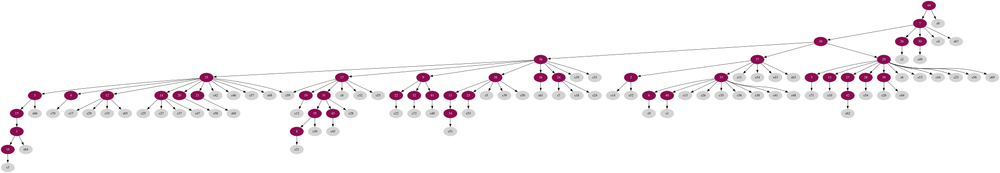

In [133]:
# Plot a tree

Source.from_file(f'../../../mt-SCITE/mt-SCITE_output/YFV2001_m_chains/0.05_1_map0.gv')

In [134]:
len(performance)

110

## Tree Likelihood

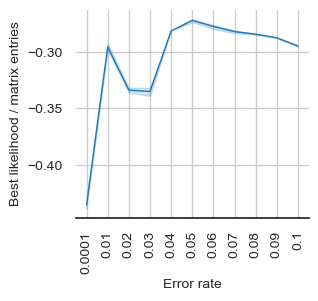

In [135]:
with plot_style(figsize=(3, 2.7), ticklabelsize=10, labelsize=10):
    sns.lineplot(data=performance, x="error_rate", y="lhood_entries", lw=1) #marker='o'
    plt.grid(axis='both')
    #ax.set_xlim(0, 20)
    plt.xticks(rotation=90)
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.ylabel('Best likelihood / matrix entries')
    plt.xlabel('Error rate')


## Average purity

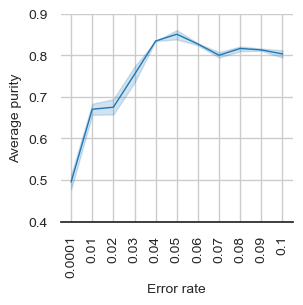

In [141]:

with plot_style(figsize=(3, 2.7), ticklabelsize=10, labelsize=10):
    ax = sns.lineplot(data=performance, x="error_rate", y="avg_purity_more_than_one_sample", markersize=4, lw=1)
    ax.set_ylim(0.4, 0.9)
    plt.grid(axis='both')
    plt.xticks(rotation=90)
    plt.ylabel('Average purity')
    plt.xlabel('Error rate')
    
    
#plt.savefig(f'../../data/simulated_figures/avg_purity_{exp}.svg', dpi=300, bbox_inches='tight', transparent=True)
#plt.savefig(f'../../data/simulated_figures/avg_purity_{exp}.jpg', dpi=300, bbox_inches='tight', transparent=True)

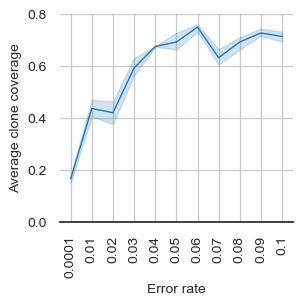

In [142]:
with plot_style(figsize=(3, 2.7), ticklabelsize=10, labelsize=10):
    ax = sns.lineplot(data=performance, x="error_rate", y="avg_clone_coverage", markersize=4, lw=1) #ci=None
    ax.set_ylim(0, 0.8)
    plt.grid(axis='both')
    plt.xticks(rotation=90)
    plt.ylabel('Average clone coverage')
    plt.xlabel('Error rate')
    
#plt.savefig(f'../../data/simulated_figures/clone_coverage_{exp}.svg', dpi=300, bbox_inches='tight', transparent=True)
#plt.savefig(f'../../data/simulated_figures/clone_coverage_{exp}.jpg', dpi=300, bbox_inches='tight', transparent=True)